In [6]:
import tensorflow as tf
from tensorflow.keras import models, layers
import numpy as np
import matplotlib.pyplot as plt
import os

In [8]:
path="E:\datset"
IMAGESIZE=256
BATCHSIZE=15
EPOCHS=50
CHANNELS=3

In [9]:
dataset=tf.keras.preprocessing.image_dataset_from_directory(
    path,
    shuffle=True,
    image_size=(IMAGESIZE,IMAGESIZE),
    batch_size=BATCHSIZE
)

Found 240 files belonging to 6 classes.


In [10]:
class_names=dataset.class_names
class_names
print(class_names)
print(len(class_names))

['Aphids', 'Army worm', 'Bacterial Blight', 'Healthy', 'Powdery Mildew', 'Target spot']
6


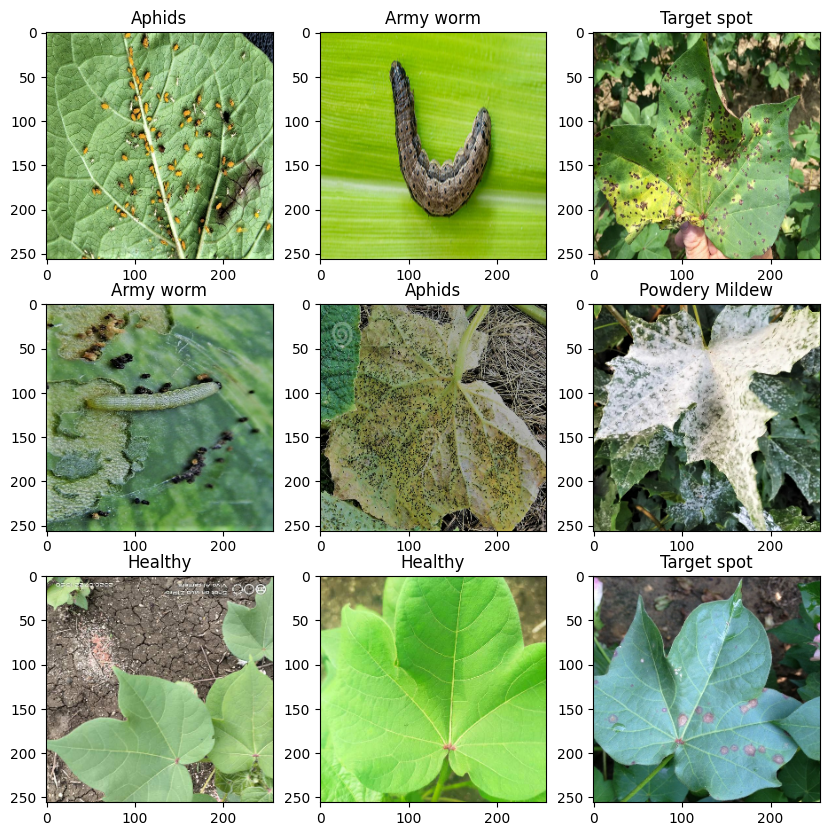

In [11]:
plt.figure(figsize=(10,10))
for image_batch,label_batch in dataset.take(1):
  for i in range(9):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(image_batch[i].numpy().astype("uint8"))
    plt.title(class_names[label_batch[i]])

In [12]:
def get_dataset_part(ds, t_s=.8, v_s=.1, test_s=.1, shuffle=True, shuffle_size=10000):
  ds_size=len(ds)
  if shuffle:
    ds=ds.shuffle(shuffle_size, seed=12)
  t_size=int(ds_size*t_s)
  v_size=int(ds_size*v_s)
  train_ds=ds.take(t_size)
  val_ds=ds.skip(t_size).take(v_size)
  test_ds=ds.skip(t_size).skip(v_size)

  return train_ds, val_ds, test_ds

In [13]:
train_ds, val_ds, test_ds=get_dataset_part(dataset)

In [15]:
print(f'''
Train_Dataset={len(train_ds)}
Validation_Dataset={len(val_ds)}
Test_Dataset={len(test_ds)}''')


Train_Dataset=12
Validation_Dataset=1
Test_Dataset=3


In [16]:
train_ds=train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds=val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test=test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [17]:
resize_and_rescale=tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGESIZE,IMAGESIZE),
    layers.experimental.preprocessing.Rescaling(1.0/255)])

In [18]:
data_aug=tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2)])

In [19]:
input_shape=(IMAGESIZE,IMAGESIZE,CHANNELS)
n_classes= len(class_names)
model=models.Sequential([
    resize_and_rescale,
    data_aug,
    layers.Conv2D(32,(3,3), activation='relu',input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(128,(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(256,(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(512,activation='relu'),
    layers.Dense(6,activation='softmax')
])
model.build(input_shape=(20,256,256,3))

In [20]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (20, 256, 256, 3)         0         
                                                                 
 sequential_1 (Sequential)   (20, 256, 256, 3)         0         
                                                                 
 conv2d (Conv2D)             (20, 254, 254, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (20, 127, 127, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (20, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (20, 62, 62, 64)         0         
 2D)                                                  

In [21]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy'])

In [22]:
history=model.fit(
    train_ds,
    epochs=EPOCHS,
    batch_size=BATCHSIZE,
    verbose=1,
    validation_data=val_ds
)

Epoch 1/50
12/12 [==============================] - 10s 629ms/step - loss: 1.8109 - accuracy: 0.1778 - val_loss: 1.7939 - val_accuracy: 0.0667
Epoch 2/50
12/12 [==============================] - 7s 596ms/step - loss: 1.7807 - accuracy: 0.1833 - val_loss: 1.8355 - val_accuracy: 0.2000
Epoch 3/50
12/12 [==============================] - 7s 572ms/step - loss: 1.7303 - accuracy: 0.2056 - val_loss: 1.7269 - val_accuracy: 0.2000
Epoch 4/50
12/12 [==============================] - 7s 577ms/step - loss: 1.6507 - accuracy: 0.3056 - val_loss: 1.6947 - val_accuracy: 0.1333
Epoch 5/50
12/12 [==============================] - 7s 573ms/step - loss: 1.5127 - accuracy: 0.3778 - val_loss: 1.8805 - val_accuracy: 0.2000
Epoch 6/50
12/12 [==============================] - 7s 576ms/step - loss: 1.4944 - accuracy: 0.3500 - val_loss: 1.5959 - val_accuracy: 0.2667
Epoch 7/50
12/12 [==============================] - 7s 606ms/step - loss: 1.3919 - accuracy: 0.4333 - val_loss: 1.6303 - val_accuracy: 0.2667
Epoch

In [23]:
scores=model.evaluate(test_ds)

3/3 [==============================] - 1s 139ms/step - loss: 0.6026 - accuracy: 0.8444


In [24]:
acc=history.history['accuracy']
val_acc=history.history['val_accuracy']
loss=history.history['loss']
val_loss=history.history['val_loss']

Text(0.5, 1.0, 'Training and Validation Loss')

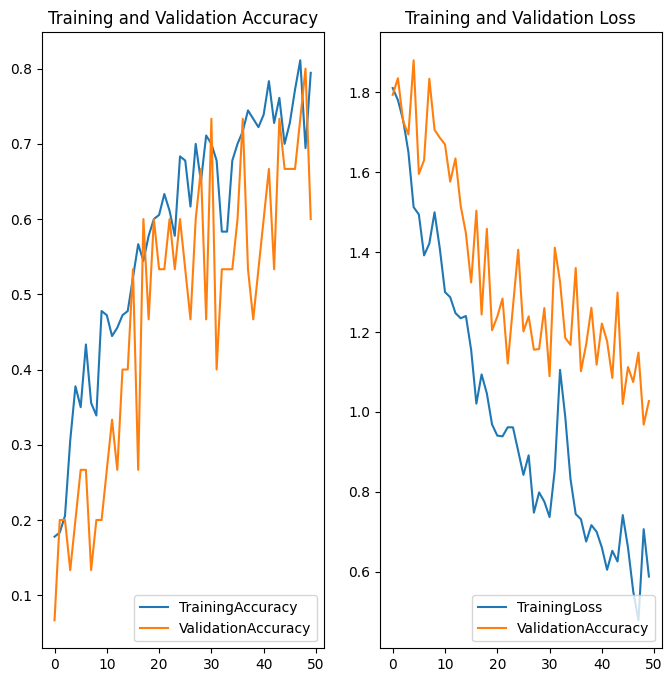

In [25]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS),acc,label='TrainingAccuracy')
plt.plot(range(EPOCHS),val_acc,label='ValidationAccuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1,2,2)
plt.plot(range(EPOCHS),loss,label='TrainingLoss')
plt.plot(range(EPOCHS),val_loss,label='ValidationAccuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Loss')

In [33]:
model.save("E:\datset\CPDPRF1.h5")

first image to predict
actual label: Army worm
1/1 [==============================] - 0s 269ms/step
predicted label: Army worm


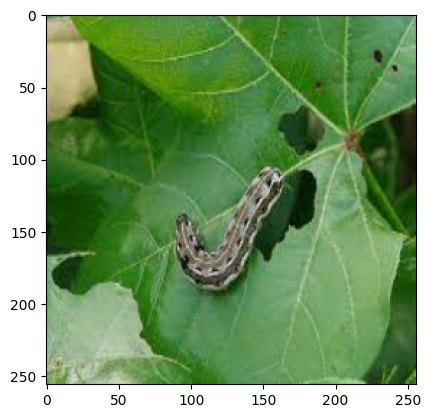

In [26]:
for images_batch, labels_batch in test_ds.take(1):

    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])

    batch_prediction = model.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

In [27]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)
    predictions = model.predict(img_array)
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 33ms/step


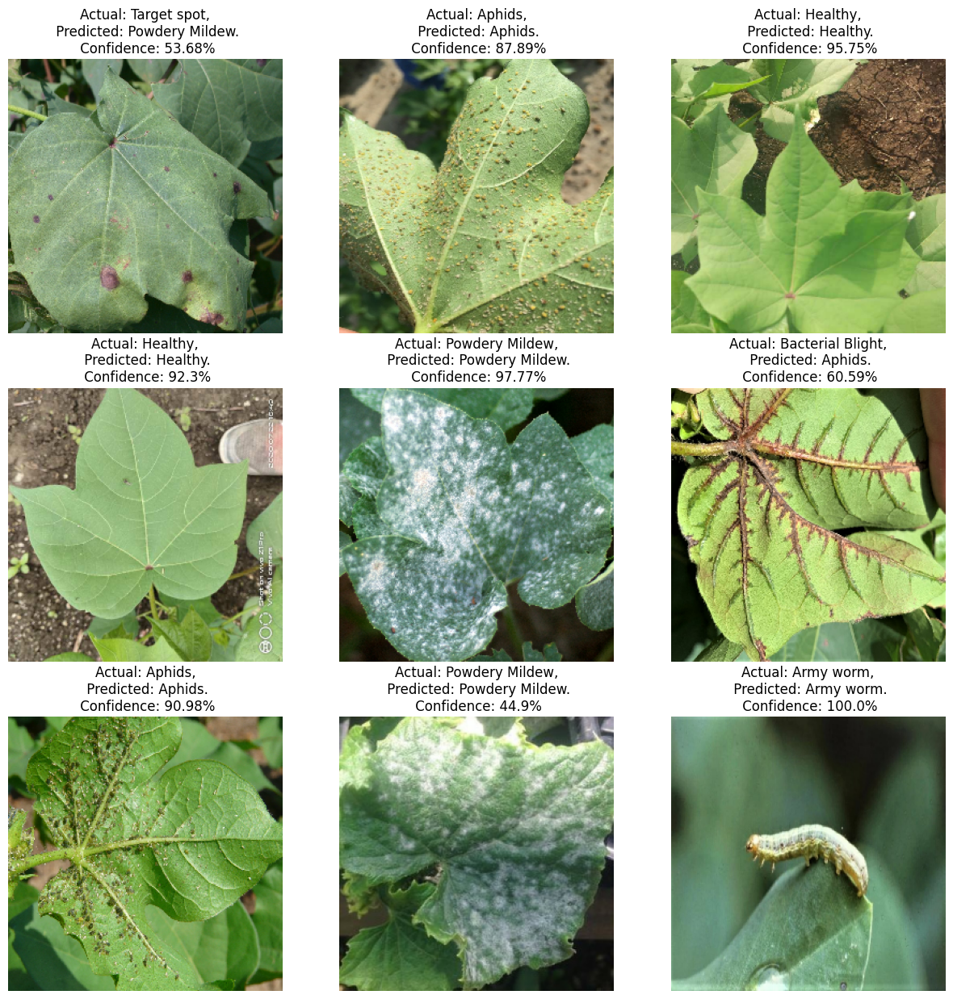

In [28]:
from sklearn.metrics import precision_score, recall_score, f1_score
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.axis("off")

1/1 [==============================] - 0s 30ms/step
Precision: 86.31%
Recall: 78.57%
F1 Score: 76.39%


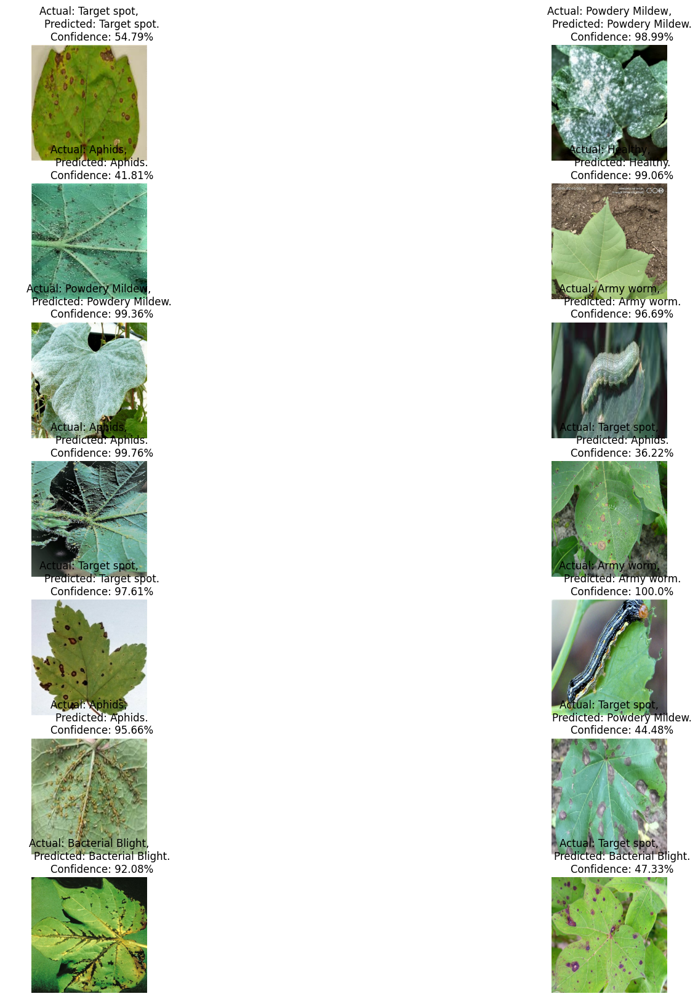

In [42]:
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 20))

true_labels = []
predicted_labels = []

for images, labels in test_ds.take(1):
    for i in range(14):
        ax = plt.subplot(7, 2, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]

        true_labels.append(actual_class)
        predicted_labels.append(predicted_class)

        plt.title(f"""Actual: {actual_class},
        Predicted: {predicted_class}.
        Confidence: {confidence}%""")
        plt.axis("off")

precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')
f1 = f1_score(true_labels, predicted_labels, average='weighted')

precision_percentage = precision * 100
recall_percentage = recall * 100
f1_percentage = f1 * 100

print("Precision: {:.2f}%".format(precision_percentage))
print("Recall: {:.2f}%".format(recall_percentage))
print("F1 Score: {:.2f}%".format(f1_percentage))

1/1 [==============================] - 0s 37ms/step
Precision: 91.67%
Recall: 88.89%
F1 Score: 88.57%


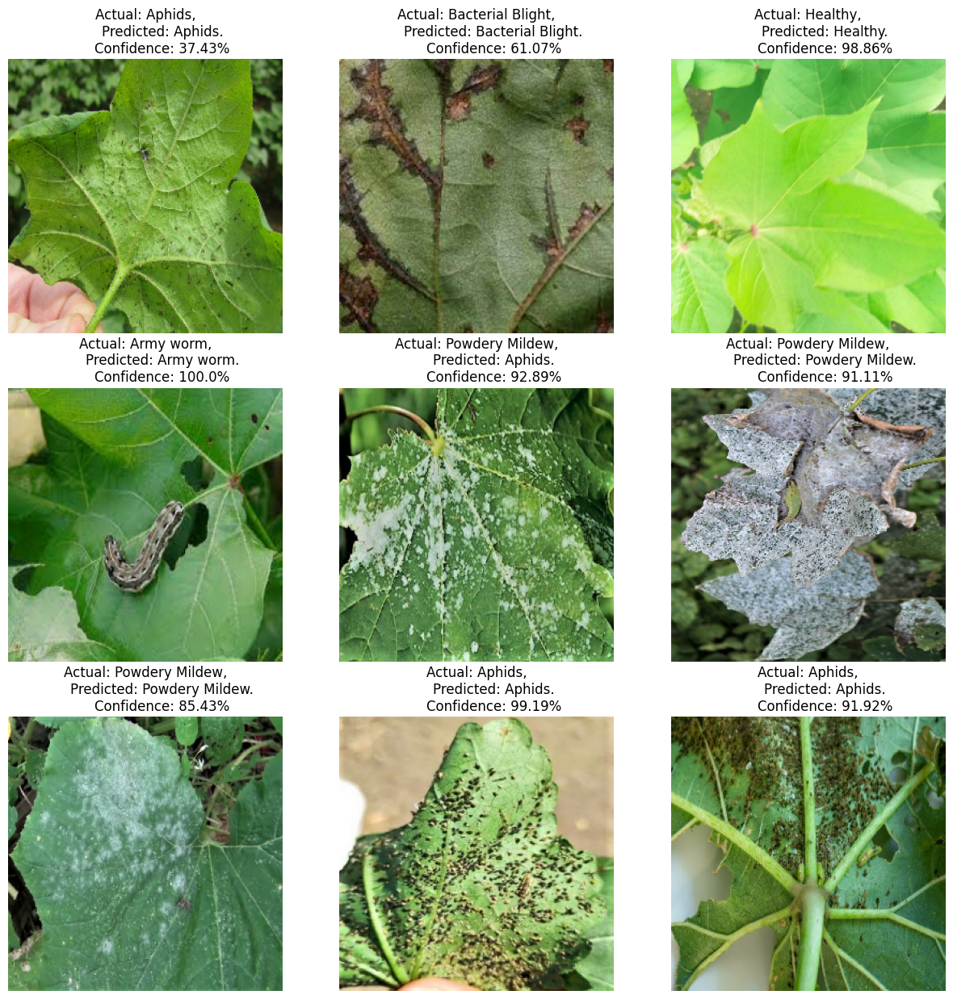

In [30]:
plt.figure(figsize=(15, 15))

true_labels = []
predicted_labels = []

for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]

        true_labels.append(actual_class)
        predicted_labels.append(predicted_class)

        plt.title(f"""Actual: {actual_class},
        Predicted: {predicted_class}.
        Confidence: {confidence}%""")
        plt.axis("off")

precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')
f1 = f1_score(true_labels, predicted_labels, average='weighted')

precision_percentage = precision * 100
recall_percentage = recall * 100
f1_percentage = f1 * 100

print("Precision: {:.2f}%".format(precision_percentage))
print("Recall: {:.2f}%".format(recall_percentage))
print("F1 Score: {:.2f}%".format(f1_percentage))

1/1 [==============================] - 0s 29ms/step
Precision: 81.48%
Recall: 88.89%
F1 Score: 84.44%


C:\Users\mrvxe\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


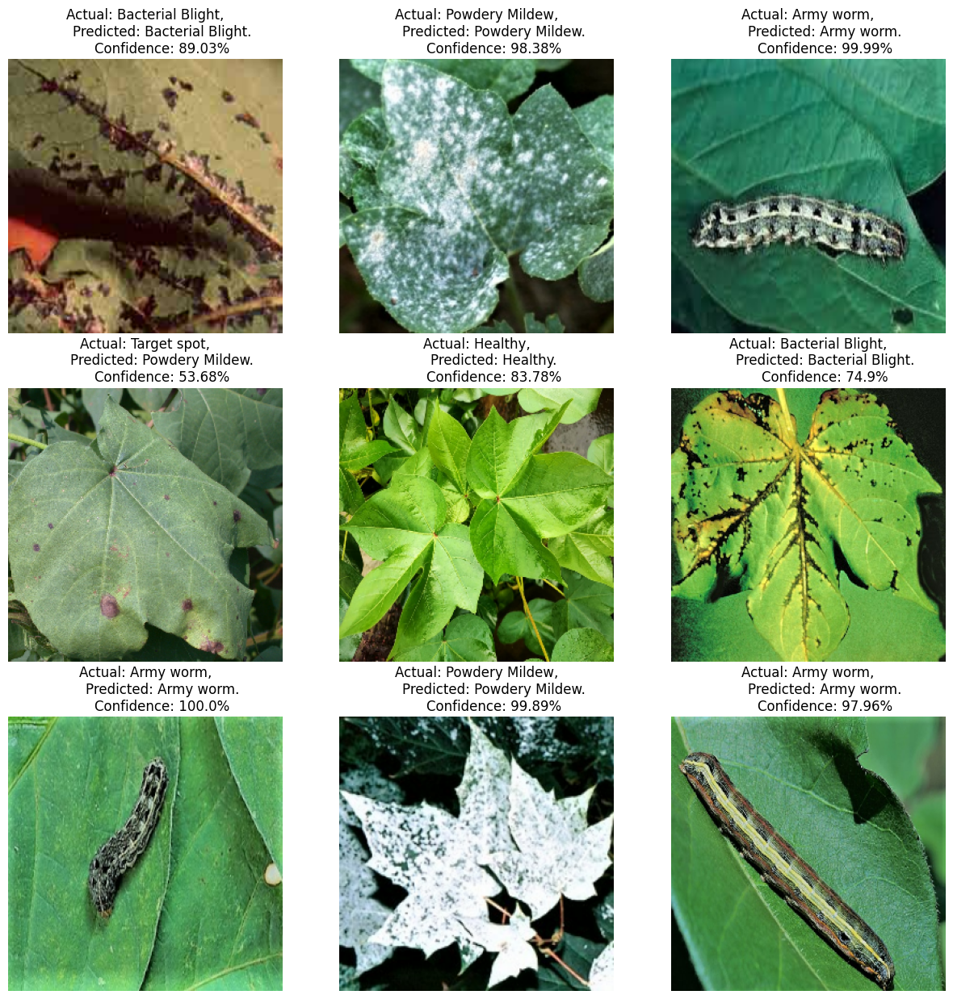

In [31]:
plt.figure(figsize=(15, 15))

true_labels = []
predicted_labels = []

for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]

        true_labels.append(actual_class)
        predicted_labels.append(predicted_class)

        plt.title(f"""Actual: {actual_class},
        Predicted: {predicted_class}.
        Confidence: {confidence}%""")
        plt.axis("off")

precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')
f1 = f1_score(true_labels, predicted_labels, average='weighted')

precision_percentage = precision * 100
recall_percentage = recall * 100
f1_percentage = f1 * 100

print("Precision: {:.2f}%".format(precision_percentage))
print("Recall: {:.2f}%".format(recall_percentage))
print("F1 Score: {:.2f}%".format(f1_percentage))

In [32]:
from tabulate import tabulate
data = [["1", "86.31%","78.57%", "76.39%"],
        ["2", "91.67%", "88.89%", "88.57%"],
        ["3", "81.48%", "88.89%", "84.44%"]]
col_names = ["Test No.", "Precision_score","Recall_score","F1_score"]
print(tabulate(data, headers=col_names, tablefmt="grid"))

+------------+-------------------+----------------+------------+
|   Test No. | Precision_score   | Recall_score   | F1_score   |
+============+===================+================+============+
|          1 | 58.89%            | 66.67%         | 58.33%     |
+------------+-------------------+----------------+------------+
|          2 | 91.67%            | 88.89%         | 88.57%     |
+------------+-------------------+----------------+------------+
|          3 | 81.48%            | 88.89%         | 84.44%     |
+------------+-------------------+----------------+------------+
